In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
import time 
import geopandas as gpd
from shapely.geometry import Point, Polygon
import geoplot as gp

In [68]:
location_data = pd.read_csv("../dataset/location.csv")
location_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3954 entries, 0 to 3953
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Province_State       3786 non-null   object 
 1   Country_Region       3954 non-null   object 
 2   Last_Update          3954 non-null   object 
 3   Lat                  3874 non-null   float64
 4   Long_                3874 non-null   float64
 5   Confirmed            3954 non-null   int64  
 6   Deaths               3954 non-null   int64  
 7   Recovered            3954 non-null   int64  
 8   Active               3952 non-null   float64
 9   Combined_Key         3954 non-null   object 
 10  Incidence_Rate       3874 non-null   float64
 11  Case-Fatality_Ratio  3906 non-null   float64
dtypes: float64(5), int64(3), object(4)
memory usage: 370.8+ KB


In [6]:
location_data.info()
location_data.Country_Region.value_counts()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3954 entries, 0 to 3953
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Province_State       3786 non-null   object 
 1   Country_Region       3954 non-null   object 
 2   Last_Update          3954 non-null   object 
 3   Lat                  3874 non-null   float64
 4   Long_                3874 non-null   float64
 5   Confirmed            3954 non-null   int64  
 6   Deaths               3954 non-null   int64  
 7   Recovered            3954 non-null   int64  
 8   Active               3952 non-null   float64
 9   Combined_Key         3954 non-null   object 
 10  Incidence_Rate       3874 non-null   float64
 11  Case-Fatality_Ratio  3906 non-null   float64
dtypes: float64(5), int64(3), object(4)
memory usage: 370.8+ KB


US             3270
Russia           83
Japan            49
India            37
Colombia         33
               ... 
Afghanistan       1
Kyrgyzstan        1
Nicaragua         1
MS Zaandam        1
Belgium           1
Name: Country_Region, Length: 188, dtype: int64

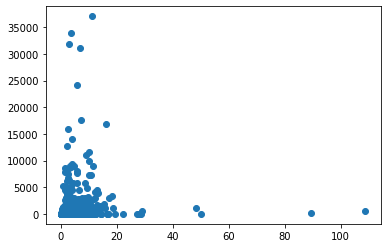

In [89]:
location_data['Case-Fatality_Ratio'].value_counts()
plt.scatter(location_data['Case-Fatality_Ratio'],location_data.Deaths)

3954


Text(0.5, 0, 'Deaths')

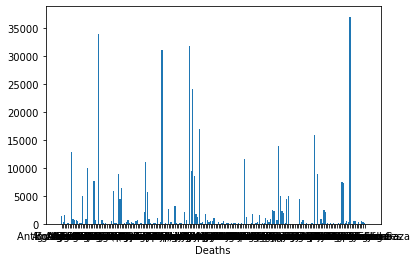

In [82]:
# location_data.loc['US'].plot()
plt.bar(location_data.Country_Region,location_data.Deaths)

print(len(location_data.Deaths))
plt.xlabel('Deaths')

In [30]:
usa = location_data[location_data.Country_Region == 'US']
# usa.info()
usa.head

<bound method NDFrame.head of      Province_State Country_Region          Last_Update        Lat  \
631         Alabama             US  2020-09-20 04:22:56  32.539527   
632         Alabama             US  2020-09-20 04:22:56  30.727750   
633         Alabama             US  2020-09-20 04:22:56  31.868263   
634         Alabama             US  2020-09-20 04:22:56  32.996421   
635         Alabama             US  2020-09-20 04:22:56  33.982109   
...             ...            ...                  ...        ...   
3896        Wyoming             US  2020-09-20 04:22:56  43.935225   
3897        Wyoming             US  2020-09-20 04:22:56  41.287818   
3898        Wyoming             US  2020-09-20 04:22:56        NaN   
3899        Wyoming             US  2020-09-20 04:22:56  43.904516   
3900        Wyoming             US  2020-09-20 04:22:56  43.839612   

           Long_  Confirmed  Deaths  Recovered  Active  \
631   -86.644082       1673      24          0  1649.0   
632   -87.722

In [86]:
# plt.bar()
usa.Province_State.value_counts()

Texas                       255
Georgia                     161
Virginia                    134
Kentucky                    121
Missouri                    117
Kansas                      106
Illinois                    104
North Carolina              101
Iowa                        100
Tennessee                    97
Nebraska                     94
Indiana                      93
Ohio                         89
Minnesota                    88
Michigan                     87
Mississippi                  83
Puerto Rico                  80
Oklahoma                     79
Arkansas                     76
Wisconsin                    73
Alabama                      69
Florida                      68
Pennsylvania                 68
South Dakota                 67
Louisiana                    66
Colorado                     66
New York                     63
California                   59
Montana                      57
West Virginia                56
North Dakota                 54
South Ca

<AxesSubplot:>

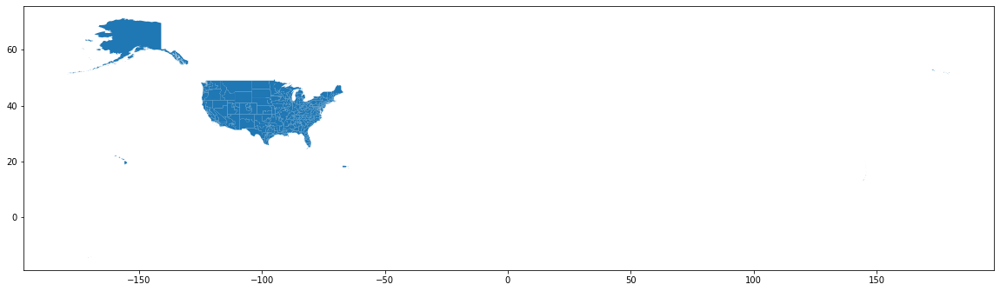

In [46]:
streetmap = gpd.read_file('../shapefiles/us/cb_2018_us_cd116_5m.shp')
fig, ax = plt.subplots(figsize = (20,20))
streetmap.plot(ax=ax)

In [47]:
crs = {'init': 'epsg:4326'}
geometry = [Point(xy) for xy in zip(usa.Long_,usa.Lat)]
geometry[:3]

In [53]:
geo_df = gpd.GeoDataFrame(usa,crs=crs,geometry=geometry)
geo_df.head()
geo_df['Case-Fatality_Ratio'].value_counts()

0.000000    635
2.941176     10
1.515152     10
2.083333      8
1.234568      7
           ... 
1.736569      1
3.968254      1
0.623137      1
3.166405      1
1.920439      1
Name: Case-Fatality_Ratio, Length: 2039, dtype: int64

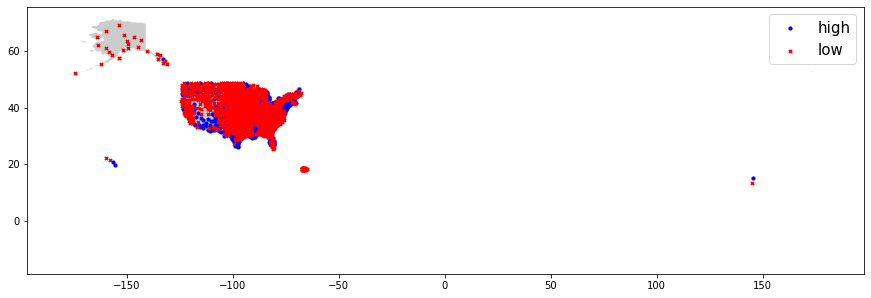

In [57]:
fig,ax = plt.subplots(figsize = (15,15))
streetmap.plot(ax=ax,alpha = 0.4,color='grey')
geo_df[geo_df['Case-Fatality_Ratio']>2].plot(ax=ax, markersize=10,color='blue',marker='o',label='high')
geo_df[geo_df['Case-Fatality_Ratio'] < 2].plot(ax=ax, markersize=10,color='red',marker='x',label='low')
plt.legend(prop={'size':15})

<AxesSubplot:>

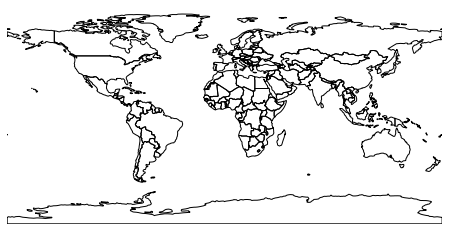

In [51]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gp.polyplot(world,figsize=(8,4))

In [8]:
def visualise_osm_scatter(search_term, title_name, country_code='DE', author_line=True):
    df = run_overpy_query(search_term=search_term, country_code=country_code)
    world = gpd.read_file('PATH\\TO\\SHAPE\\FILE\\FOLDER\\ne_10m_admin_1_states_provinces\\ne_10m_admin_1_states_provinces.shp')
    fig, ax = plt.subplots(figsize=[8, 9.5])
    ax.axis('off')
    world[world['iso_a2']=='DE'].plot(color='w', edgecolor='black', linewidth=0.5, ax=ax)
    ax.scatter(df['lon'], df['lat'], c='red')
    ax.set_title('Location of the {} places\nnamed after {}\n'.format(len(df), title_name),
                 color=(0.41, 0.41, 0.41),
                 size=20)
    #author line
    if author_line:
        fig.text(0.99, 0.01, '@rikunert', color='lightgrey', style='italic',
             horizontalalignment='right')

    return fig, ax

In [ ]:
gpd.